In [4]:
import os

from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib.pyplot as plt
import cv2
import numpy as np
from skimage import morphology, filters
import pandas as pd

## Holographic Ripple Filter
The following class applies a PIL transform that
1) blurs to suppress noise
2) thresholds (Otsu or adaptive)
3) morphological-opens to knock out thin fringes
4) applies mask to original gray image, setting background to white
5) recenters & scales the object to fill the frame
6) finds the object bbox
7) scales it by up to `max_scale` (but no more than frame size)
8) pastes centered on white canvas

In [5]:
class RemoveRipples(object):
    def __init__(
        self,
        method: str = "otsu",
        blur_ksize: int = 5,
        adaptive_blocksize: int = 51,
        adaptive_C: int = 2,
        morph_ksize: int = 5,
        max_scale: float = 1.7,
    ):
        self.method = method.lower()
        self.blur_ksize = blur_ksize
        self.adaptive_blocksize = adaptive_blocksize
        self.adaptive_C = adaptive_C
        self.morph_ksize = morph_ksize
        self.max_scale = max_scale

        self._morph_kernel = cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE, (self.morph_ksize, self.morph_ksize)
        )

    def __call__(self, img: Image.Image) -> Image.Image:
        orig = np.array(img.convert("L"), dtype=np.uint8)
        h, w = orig.shape

        # blur & threshold as before
        blur = cv2.GaussianBlur(orig, (self.blur_ksize,) * 2, 0)
        if self.method == "otsu":
            _, mask = cv2.threshold(
                blur, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU
            )
        else:
            mask = cv2.adaptiveThreshold(
                blur,
                255,
                cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                cv2.THRESH_BINARY_INV,
                self.adaptive_blocksize,
                self.adaptive_C,
            )
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, self._morph_kernel)

        # apply mask
        result = np.where(mask == 255, orig, 255).astype(np.uint8)

        # find bbox of object
        ys, xs = np.where(result < 255)
        if len(xs) == 0 or len(ys) == 0:
            return Image.new("L", (w, h), color=255)

        y1, y2 = ys.min(), ys.max()
        x1, x2 = xs.min(), xs.max()
        crop = result[y1 : y2 + 1, x1 : x2 + 1]

        crop_h, crop_w = crop.shape
        max_by_frame = min(w / crop_w, h / crop_h)
        scale = min(self.max_scale, max_by_frame)

        new_w = int(crop_w * scale)
        new_h = int(crop_h * scale)

        # resize & paste
        crop_pil = Image.fromarray(crop, mode="L")
        resized = crop_pil.resize((new_w, new_h), resample=Image.LANCZOS)
        canvas = Image.new("L", (w, h), color=255)
        x_off = (w - new_w) // 2
        y_off = (h - new_h) // 2
        canvas.paste(resized, (x_off, y_off))

        return canvas

C:\Users\super\AppData\Local\Temp\ipykernel_32572\1517962255.py:19: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  gray_img = Image.fromarray(arr.astype(np.uint8), mode="L")
C:\Users\super\AppData\Local\Temp\ipykernel_32572\4277447103.py:63: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  crop_pil = Image.fromarray(crop, mode="L")


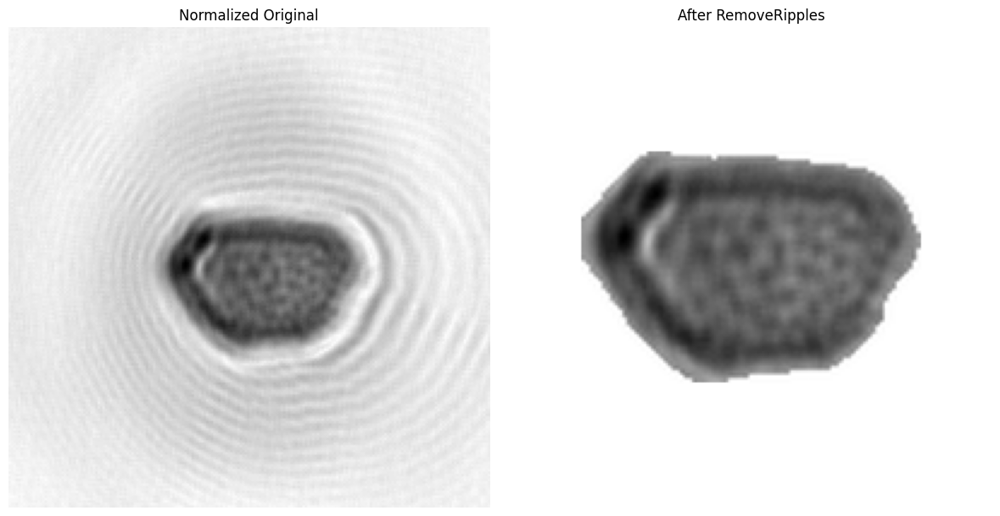

In [6]:
ripple_filter = RemoveRipples(
    method="otsu",
    blur_ksize=5,
    adaptive_blocksize=51,
    adaptive_C=2,
    morph_ksize=5,
    max_scale=1.7,
)

image_path = "../data/subset_poleno/g_carpinus_s_betulus/poleno-27_2023-04-06_18.06.28.175254_ev.computed_data.holography.image_pairs.0.0.rec_mag.png"

img = Image.open(image_path)
arr = np.array(img).astype(np.float32)
min_val, max_val = arr.min(), arr.max()
if max_val > min_val:
    arr = (arr - min_val) / (max_val - min_val) * 255.0
else:
    arr = np.zeros_like(arr)
gray_img = Image.fromarray(arr.astype(np.uint8), mode="L")

filtered_img = ripple_filter(gray_img)

orig_arr = np.array(gray_img)
filtered_arr = np.array(filtered_img)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(orig_arr, cmap="gray")
axes[0].set_title("Normalized Original")
axes[0].axis("off")

axes[1].imshow(filtered_arr, cmap="gray")
axes[1].set_title("After RemoveRipples")
axes[1].axis("off")

plt.tight_layout()
plt.show()

In [8]:
class HolographicPollenDataset(Dataset):
    def __init__(self, transform=None, extensions=None):
        self.root_dir = os.path.join(os.getenv("DATA_DIR_PATH"), "subset_poleno")
        self.transform = transform
        self.extensions = extensions or [".png"]

        self.classes = sorted(
            [
                d
                for d in os.listdir(self.root_dir)
                if os.path.isdir(os.path.join(self.root_dir, d))
            ]
        )

        raw_samples = []
        for taxa in self.classes:
            cls_dir = os.path.join(self.root_dir, taxa)
            for fname in os.listdir(cls_dir):
                if any(fname.lower().endswith(ext) for ext in self.extensions):
                    path = os.path.join(cls_dir, fname)
                    raw_samples.append((path, taxa))

        groups = {}
        for path, taxa in raw_samples:
            fname = os.path.basename(path)
            if "image_pairs" not in fname:
                continue
            base = fname.split("image_pairs")[0]
            groups.setdefault((base, taxa), []).append(path)

        # Build pairs list
        self.pairs = []  # (path0, path1, taxa_name)
        for (base, taxa), paths in groups.items():
            p0 = next((p for p in paths if ".0." in os.path.basename(p)), None)
            p1 = next((p for p in paths if ".1." in os.path.basename(p)), None)

            if p0 and p1:
                self.pairs.append((p0, p1, taxa))

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        path0, path1, taxa = self.pairs[idx]

        def load_and_normalize(p):
            img = Image.open(p)
            arr = np.array(img).astype(np.float32)
            mn, mx = arr.min(), arr.max()
            if mx > mn:
                arr = (arr - mn) / (mx - mn) * 255.0
            else:
                arr = np.zeros_like(arr)
            return Image.fromarray(arr.astype(np.uint8), mode="L")

        img0 = load_and_normalize(path0)
        img1 = load_and_normalize(path1)

        if self.transform:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        # Return images, taxa, and the paths for reference
        return {
            "images": (img0, img1),
            "taxa": taxa,
            "paths": (path0, path1),
            "image_pair_idx": idx,
        }


transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        RemoveRipples(
            method="otsu",
            blur_ksize=5,
            adaptive_blocksize=51,
            adaptive_C=2,
            morph_ksize=5,
        ),
        transforms.ToTensor(),
    ]
)

dataset = HolographicPollenDataset(transform=transform)

In [10]:
# Test the dataset with new structure
sample = dataset[0]
print("Sample structure:")
print(f"Images shape: {sample['images'][0].shape}, {sample['images'][1].shape}")
print(f"Taxa: {sample['taxa']}")
print(f"Paths: {sample['paths'][0]}")
print(f"       {sample['paths'][1]}")
print(f"Image pair index: {sample['image_pair_idx']}")

# Check if the two images in the pair are equal
torch.all(
    sample["images"][0] == sample["images"][1]
)  # Check if the two images in the pair are equal

Sample structure:
Images shape: torch.Size([1, 224, 224]), torch.Size([1, 224, 224])
Taxa: g_carpinus_s_betulus
Paths: C:/Users/super/Documents/Github/sequoia/data\subset_poleno\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.27.896254_ev.computed_data.holography.image_pairs.0.0.rec_mag.png
       C:/Users/super/Documents/Github/sequoia/data\subset_poleno\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.27.896254_ev.computed_data.holography.image_pairs.0.1.rec_mag.png
Image pair index: 0


C:\Users\super\AppData\Local\Temp\ipykernel_32572\354449685.py:54: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  return Image.fromarray(arr.astype(np.uint8), mode="L")
C:\Users\super\AppData\Local\Temp\ipykernel_32572\4277447103.py:63: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  crop_pil = Image.fromarray(crop, mode="L")


tensor(False)

Image 0 path: C:/Users/super/Documents/Github/sequoia/data\subset_poleno\g_carpinus_s_betulus\poleno-27_2023-04-06_18.07.06.083759_ev.computed_data.holography.image_pairs.0.0.rec_mag.png
Image 1 path: C:/Users/super/Documents/Github/sequoia/data\subset_poleno\g_carpinus_s_betulus\poleno-27_2023-04-06_18.07.06.083759_ev.computed_data.holography.image_pairs.0.1.rec_mag.png


C:\Users\super\AppData\Local\Temp\ipykernel_32572\354449685.py:54: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  return Image.fromarray(arr.astype(np.uint8), mode="L")
C:\Users\super\AppData\Local\Temp\ipykernel_32572\4277447103.py:63: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  crop_pil = Image.fromarray(crop, mode="L")


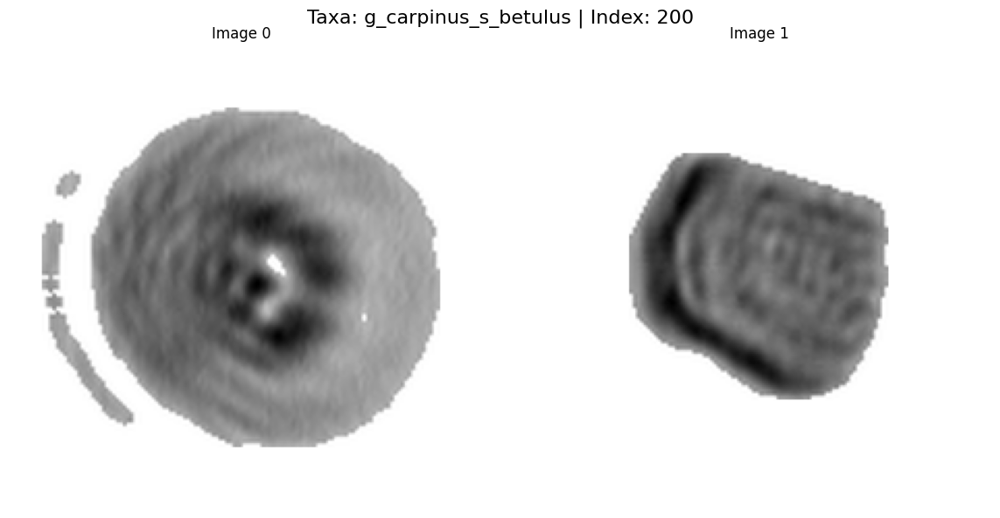

In [11]:
x = 200  # Changed from 2000 to a smaller number to avoid index errors

sample = dataset[x]
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Display the images
axes[0].imshow(sample["images"][0].numpy().transpose(1, 2, 0), cmap="gray")
axes[0].set_title("Image 0")
axes[0].axis("off")

axes[1].imshow(sample["images"][1].numpy().transpose(1, 2, 0), cmap="gray")
axes[1].set_title("Image 1")
axes[1].axis("off")

# Show taxa and paths in the title
fig.suptitle(f'Taxa: {sample["taxa"]} | Index: {x}', fontsize=16)

# Print paths for reference
print(f"Image 0 path: {sample['paths'][0]}")
print(f"Image 1 path: {sample['paths'][1]}")

plt.tight_layout()
plt.show()

In [12]:
# Generate 256x256 images using the dataset with paths
from pathlib import Path


def generate_256x256_images(dataset, output_dir="generated_holo_256", max_samples=10):
    """Generate 256x256 images from the holographic dataset."""

    # Create output directory
    output_path = Path(output_dir)
    output_path.mkdir(exist_ok=True)

    # Create 256x256 transform
    transform_256 = transforms.Compose(
        [
            RemoveRipples(
                method="otsu",
                blur_ksize=5,
                adaptive_blocksize=51,
                adaptive_C=2,
                morph_ksize=5,
                max_scale=1.7,
            ),
            transforms.Resize(
                (256, 256), interpolation=transforms.InterpolationMode.LANCZOS
            ),
            transforms.ToTensor(),
        ]
    )

    print(
        f"Generating {min(max_samples, len(dataset))} samples at 256x256 resolution..."
    )

    for i in range(min(max_samples, len(dataset))):
        # Get original sample data
        sample = dataset[i]
        taxa = sample["taxa"]
        paths = sample["paths"]

        # Create taxa directory
        taxa_dir = output_path / taxa
        taxa_dir.mkdir(exist_ok=True)

        # Process each image in the pair
        for img_idx, img_path in enumerate(paths):
            # Load and process the original image (without dataset transform)
            img = Image.open(img_path)
            arr = np.array(img).astype(np.float32)
            mn, mx = arr.min(), arr.max()
            if mx > mn:
                arr = (arr - mn) / (mx - mn) * 255.0
            else:
                arr = np.zeros_like(arr)

            # Convert to PIL and apply 256x256 transform
            pil_img = Image.fromarray(arr.astype(np.uint8), mode="L")
            transformed_img = transform_256(pil_img)

            # Convert tensor back to PIL for saving
            if transformed_img.dim() == 3 and transformed_img.size(0) == 1:
                transformed_img = transformed_img.squeeze(0)

            img_array = (transformed_img.numpy() * 255).astype(np.uint8)
            final_img = Image.fromarray(img_array, mode="L")

            # Create filename from original path
            original_name = Path(img_path).stem
            output_filename = f"{original_name}_256x256.png"
            output_file = taxa_dir / output_filename

            # Save the image
            final_img.save(output_file)
            print(f"Saved: {output_file}")

    print(f"\nGeneration complete! Images saved to: {output_path}")


# Test with a few samples
generate_256x256_images(dataset, max_samples=5)

Generating 5 samples at 256x256 resolution...
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.27.896254_ev.computed_data.holography.image_pairs.0.0.rec_mag_256x256.png
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.27.896254_ev.computed_data.holography.image_pairs.0.1.rec_mag_256x256.png
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.28.175254_ev.computed_data.holography.image_pairs.0.0.rec_mag_256x256.png
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.28.175254_ev.computed_data.holography.image_pairs.0.1.rec_mag_256x256.png
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.28.401254_ev.computed_data.holography.image_pairs.0.0.rec_mag_256x256.png
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-06_18.06.28.401254_ev.computed_data.holography.image_pairs.0.1.rec_mag_256x256.png
Saved: generated_holo_256\g_carpinus_s_betulus\poleno-27_2023-04-0

C:\Users\super\AppData\Local\Temp\ipykernel_32572\354449685.py:54: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  return Image.fromarray(arr.astype(np.uint8), mode="L")
C:\Users\super\AppData\Local\Temp\ipykernel_32572\4277447103.py:63: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  crop_pil = Image.fromarray(crop, mode="L")
C:\Users\super\AppData\Local\Temp\ipykernel_32572\64283392.py:56: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  pil_img = Image.fromarray(arr.astype(np.uint8), mode="L")
C:\Users\super\AppData\Local\Temp\ipykernel_32572\64283392.py:64: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  final_img = Image.fromarray(img_array, mode="L")


In [13]:
import sys

# move out of the current directory
sys.path.append("../")

from data import HolographicPolenoDataModule

In [14]:
datamodule = HolographicPolenoDataModule(
    batch_size=3, num_workers=0, image_transforms=transform
)

In [15]:
datamodule.setup("test")

for batch in datamodule.test_dataloader():
    print(batch[0][0].shape, batch[1])

torch.Size([3, 1, 224, 224]) ('g_carpinus_s_betulus', 'g_carpinus_s_betulus', 'g_carpinus_s_betulus')
torch.Size([3, 1, 224, 224]) ('g_fagus_s_sylvatica', 'g_fagus_s_sylvatica', 'g_fagus_s_sylvatica')
torch.Size([3, 1, 224, 224]) ('g_olea_s_europaea', 'g_olea_s_europaea', 'g_olea_s_europaea')
torch.Size([3, 1, 224, 224]) ('g_parietaria_s_officinalis', 'g_parietaria_s_officinalis', 'g_parietaria_s_officinalis')
torch.Size([3, 1, 224, 224]) ('g_picea_s_abies', 'g_picea_s_abies', 'g_picea_s_abies')
torch.Size([3, 1, 224, 224]) ('g_rumex_s_acetosella', 'g_rumex_s_acetosella', 'g_rumex_s_acetosella')
torch.Size([3, 1, 224, 224]) ('g_urtica_s_dioica', 'g_urtica_s_dioica', 'g_urtica_s_dioica')


C:\Users\super\AppData\Local\Temp\ipykernel_32572\4277447103.py:63: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  crop_pil = Image.fromarray(crop, mode="L")


In [16]:
results = pd.read_csv("../eval/Holo/mesh_eval_results_holo.csv")
display(results)

,model,pred_path,gt_path,timestamp,chamfer,hausdorff,fscore_1,fscore_2_5,fscore_5,plot_path,...,area_diff,edge_mean_pred,edge_std_pred,edge_mean_gt,edge_std_gt,voxel_iou,euler_pred,euler_gt,normal_consistency,voxel_plot_path
0,pix2vox_aug_holo_test,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.154529,0.274747,0.518404,0.048304,0.155132,0.245371,C:\Users\super\Documents\Github\sequoia\TestEv...,...,7.345081,0.036331,0.009704,0.027024,0.006102,0.041999,1808,29768,0.466929,NaN
1,pix2vox_aug_holo_test,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.693529,0.365292,0.616100,0.049576,0.126858,0.211536,C:\Users\super\Documents\Github\sequoia\TestEv...,...,7.021061,0.036286,0.009695,0.027459,0.006055,0.082730,1830,27612,0.470109,NaN
2,pix2vox_aug_holo_test,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.693529,0.345845,0.578974,0.052269,0.143420,0.219657,C:\Users\super\Documents\Github\sequoia\TestEv...,...,7.021061,0.036286,0.009695,0.027459,0.006055,0.083125,1830,27612,0.471913,NaN
3,pix2vox_aug_holo_test,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.792529,0.321212,0.615109,0.042692,0.134813,0.210626,C:\Users\super\Documents\Github\sequoia\TestEv...,...,7.716272,0.036562,0.009696,0.025141,0.005703,0.073616,1832,36120,0.471068,NaN
4,pix2vox_aug_holo_test,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.792529,0.336484,0.627440,0.045842,0.138141,0.216667,C:\Users\super\Documents\Github\sequoia\TestEv...,...,7.716272,0.036562,0.009696,0.025141,0.005703,0.070062,1832,36120,0.467419,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,PixelNerf_aug_holo,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2023-05-05_10.14.49.372481,0.231173,0.464058,0.070095,0.213265,0.341682,C:\Users\super\Documents\Github\sequoia\TestEv...,...,6.860603,0.008211,0.003978,0.021240,0.004837,0.197280,-141,52840,0.280086,NaN
59,PixelNerf_aug_holo,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2023-05-05_10.14.49.480481,0.263637,0.528333,0.068378,0.198498,0.317766,C:\Users\super\Documents\Github\sequoia\TestEv...,...,6.474604,0.008287,0.003848,0.019992,0.004430,0.158128,-16,54206,0.292415,NaN
60,PixelNerf_aug_holo,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.693529,0.289123,0.560733,0.055495,0.165984,0.257682,C:\Users\super\Documents\Github\sequoia\TestEv...,...,6.953423,0.008262,0.003882,0.027459,0.006055,0.095982,-46,27612,0.289762,NaN
61,PixelNerf_aug_holo,C:\Users\super\Documents\Github\sequoia\TestEv...,C:\Users\super\Documents\Github\sequoia\TestEv...,2022-09-07_12.08.31.792529,0.239321,0.371761,0.042866,0.141532,0.242672,C:\Users\super\Documents\Github\sequoia\TestEv...,...,7.065621,0.008200,0.003999,0.025141,0.005703,0.112514,-68,36120,0.272694,NaN


In [17]:
filtered = results

aggregated = filtered.groupby("model", as_index=False).agg(
    mean_chamfer=("chamfer", "mean"),
    std_chamfer=("chamfer", "std"),
    mean_fscore_1=("fscore_1", "mean"),
    std_fscore_1=("fscore_1", "std"),
    mean_fscore_2_5=("fscore_2_5", "mean"),
    std_fscore_2_5=("fscore_2_5", "std"),
    mean_fscore_5=("fscore_5", "mean"),
    std_fscore_5=("fscore_5", "std"),
    mean_iou=("voxel_iou", "mean"),
    std_iou=("voxel_iou", "std"),
)

aggregated

,model,mean_chamfer,std_chamfer,mean_fscore_1,std_fscore_1,mean_fscore_2_5,std_fscore_2_5,mean_fscore_5,std_fscore_5,mean_iou,std_iou
0,Pixel2MeshPlusPlus,0.170213,0.045721,0.082767,0.026300,0.346151,0.081326,0.513292,0.095900,0.347238,0.091474
1,PixelNerf_aug_holo,0.200071,0.064183,0.078835,0.029039,0.278215,0.107824,0.425491,0.148836,0.282719,0.180242
2,pix2vox_aug_holo_test,0.236172,0.065876,0.066713,0.020964,0.220725,0.086748,0.347931,0.128008,0.165041,0.139871


In [18]:
# Holographic Pollen 3D Reconstruction Visualization System
import pandas as pd



import matplotlib.pyplot as plt



from pathlib import Path



import numpy as np



from PIL import Image
import trimesh



import warnings
import os



warnings.filterwarnings("ignore")



# Configuration



MAPPING_CSV = (
    "C:/Users/super/Documents/Github/sequoia/Eval/Holo/holo_file_mapping_complete.csv"
)



MESH_BASE_DIR = (
    "C:/Users/super/Documents/Github/sequoia/TestEvaluationPipeline/data_holo"
)



IMAGE_BASE_DIR = os.path.join(os.getenv("DATA_DIR_PATH", ""), "subset_poleno")


# Load mapping data



mapping_df = pd.read_csv(MAPPING_CSV)



print(f"Loaded {len(mapping_df)} reconstruction mappings")


class HolographicReconstructionVisualizer:

    """Visualization system for holographic pollen 3D reconstructions."""


    def __init__(self, mapping_df, mesh_base_dir, image_base_dir):
        self.mapping_df = mapping_df
        self.mesh_base_dir = mesh_base_dir
        self.image_base_dir = image_base_dir
        self.mesh_types = [
            "gt_file",
            "pix2vox_file",
            "pixel2mesh_file",
            "pixelnerf_file",
        ]
        self.mesh_labels = [
            "Ground Truth\n(Visual Hull)",
            "Pix2Vox",
            "Pixel2Mesh",
            "PixelNeRF",
        ]
        self.mesh_colors = ["lightblue", "lightcoral", "lightgreen", "plum"]
        self.overlay_colors = ["blue", "red", "green", "purple"]
        self.alphas = [0.8, 0.6, 0.6, 0.6]

    def load_and_normalize_image(self, image_path):
        """Load and normalize an image for display."""

        if not os.path.exists(image_path):

            return None


        img = Image.open(image_path)

        arr = np.array(img).astype(np.float32)

        if arr.max() > arr.min():

            arr = (arr - arr.min()) / (arr.max() - arr.min()) * 255.0

        else:

            arr = np.zeros_like(arr)

        return arr.astype(np.uint8)


    def find_image_path_for_timestamp(self, timestamp):
        """Find the corresponding image file for a given timestamp."""

        for taxa_dir in Path(self.image_base_dir).iterdir():

            if taxa_dir.is_dir():

                for img_file in taxa_dir.iterdir():
                    if (
                        img_file.is_file()
                        and timestamp in img_file.name

                        and "image_pairs.0.0.rec_mag.png" in img_file.name
                    ):

                        return str(img_file)

        return None


    def find_mesh_file(self, filename, mesh_type=None):
        """Find a mesh file with special handling for ground truth."""

        if not os.path.exists(self.mesh_base_dir):

            return None


        # Ground truth files are in vh_2img_holo_test directory

        if mesh_type == "gt_file":

            gt_dir = os.path.join(self.mesh_base_dir, "vh_2img_holo_test")

            if os.path.exists(gt_dir):

                gt_path = os.path.join(gt_dir, filename)

                if os.path.exists(gt_path):

                    return gt_path


        # Search in all subdirectories for other files

        for root, dirs, files in os.walk(self.mesh_base_dir):

            if filename in files:

                return os.path.join(root, filename)

        return None


    def load_mesh_safe(self, mesh_path, verbose=False):
        """Safely load a mesh file."""

        try:

            if mesh_path and os.path.exists(mesh_path):

                mesh = trimesh.load(mesh_path)

                if verbose:
                    print(f"✓ Successfully loaded: {os.path.basename(mesh_path)}")

                return mesh

            else:

                if verbose:
                    print(f"✗ File not found: {mesh_path}")

        except Exception as e:

            if verbose:
                print(f"✗ Error loading mesh {mesh_path}: {e}")

        return None


    def plot_single_comparison(self, timestamp, verbose=False):
        """Create a comparison plot for one timestamp."""

        # Find the row for this timestamp

        row = self.mapping_df[self.mapping_df["timestamp"] == timestamp]

        if row.empty:
            if verbose:

                print(f"No mapping found for timestamp {timestamp}")

            return None


        row = row.iloc[0]


        # Find corresponding image

        image_path = self.find_image_path_for_timestamp(timestamp)

        if not image_path:
            if verbose:

                print(f"No image found for timestamp {timestamp}")

            return None


        # Load image

        image_arr = self.load_and_normalize_image(image_path)

        if image_arr is None:
            if verbose:

                print(f"Could not load image {image_path}")

            return None


        # Create figure

        fig = plt.figure(figsize=(20, 8))


        # Plot input image

        ax_img = plt.subplot(2, 5, 1)

        ax_img.imshow(image_arr, cmap="gray")

        ax_img.set_title("Input Image\n(Holographic)", fontsize=12, fontweight="bold")

        ax_img.axis("off")


        # Load and plot meshes

        meshes_loaded = []


        for i, (mesh_type, label, color) in enumerate(
            zip(self.mesh_types, self.mesh_labels, self.mesh_colors)
        ):

            mesh = None


            if pd.notna(row[mesh_type]):

                mesh_filename = row[mesh_type]

                mesh_path = self.find_mesh_file(mesh_filename, mesh_type)


                if mesh_path:

                    mesh = self.load_mesh_safe(mesh_path, verbose)

                elif verbose:

                    print(f"✗ Mesh file not found: {mesh_filename}")

            meshes_loaded.append(mesh)


            # Create subplot for mesh

            ax = fig.add_subplot(2, 5, i + 2, projection="3d")


            if mesh is not None:

                vertices = mesh.vertices

                faces = mesh.faces


                ax.plot_trisurf(
                    vertices[:, 0],
                    vertices[:, 1],
                    vertices[:, 2],
                    triangles=faces,
                    alpha=0.8,
                    shade=True,
                    color=color,
                )


                # Set equal aspect ratio

                max_range = (
                    np.array(
                        [
                            vertices[:, 0].max() - vertices[:, 0].min(),
                            vertices[:, 1].max() - vertices[:, 1].min(),
                            vertices[:, 2].max() - vertices[:, 2].min(),
                        ]
                    ).max()
                    / 2.0
                )


                mid_x = (vertices[:, 0].max() + vertices[:, 0].min()) * 0.5

                mid_y = (vertices[:, 1].max() + vertices[:, 1].min()) * 0.5

                mid_z = (vertices[:, 2].max() + vertices[:, 2].min()) * 0.5


                ax.set_xlim(mid_x - max_range, mid_x + max_range)

                ax.set_ylim(mid_y - max_range, mid_y + max_range)

                ax.set_zlim(mid_z - max_range, mid_z + max_range)


                ax.set_title(
                    f"{label}\n✓ Loaded",
                    fontsize=10,
                    fontweight="bold" if i == 0 else "normal",
                    color="darkgreen",
                )

            else:

                mesh_filename = (
                    row[mesh_type] if pd.notna(row[mesh_type]) else "No mapping"
                )

                ax.text(
                    0.5,
                    0.5,
                    0.5,
                    f"Not available\n{mesh_filename[:20]}...",
                    horizontalalignment="center",
                    verticalalignment="center",
                    transform=ax.transAxes,
                    fontsize=8,
                    color="red" if pd.notna(row[mesh_type]) else "gray",
                )

                ax.set_title(
                    f"{label}\n✗ Missing",
                    fontsize=10,
                    color="red" if pd.notna(row[mesh_type]) else "gray",
                )


            ax.set_xlabel("X")

            ax.set_ylabel("Y")

            ax.set_zlabel("Z")


        # Create overlay comparison
        ax_comparison = fig.add_subplot(2, 5, (6, 10), projection="3d")

        all_vertices = []

        loaded_labels = []


        for i, (mesh, color, alpha, label) in enumerate(
            zip(meshes_loaded, self.overlay_colors, self.alphas, self.mesh_labels)
        ):

            if mesh is not None:

                vertices = mesh.vertices

                faces = mesh.faces

                all_vertices.append(vertices)

                loaded_labels.append(f"{label.replace(chr(10), ' ')} ({color})")


                ax_comparison.plot_trisurf(
                    vertices[:, 0],
                    vertices[:, 1],
                    vertices[:, 2],
                    triangles=faces,
                    alpha=alpha,
                    color=color,
                )

        if all_vertices:

            # Set equal aspect ratio

            all_verts = np.vstack(all_vertices)

            max_range = (
                np.array(
                    [
                        all_verts[:, 0].max() - all_verts[:, 0].min(),
                        all_verts[:, 1].max() - all_verts[:, 1].min(),
                        all_verts[:, 2].max() - all_verts[:, 2].min(),
                    ]
                ).max()
                / 2.0
            )


            mid_x = (all_verts[:, 0].max() + all_verts[:, 0].min()) * 0.5

            mid_y = (all_verts[:, 1].max() + all_verts[:, 1].min()) * 0.5

            mid_z = (all_verts[:, 2].max() + all_verts[:, 2].min()) * 0.5


            ax_comparison.set_xlim(mid_x - max_range, mid_x + max_range)

            ax_comparison.set_ylim(mid_y - max_range, mid_y + max_range)

            ax_comparison.set_zlim(mid_z - max_range, mid_z + max_range)


            # Add legend

            if loaded_labels:

                ax_comparison.text2D(
                    0.02,
                    0.98,
                    "\n".join(loaded_labels),
                    transform=ax_comparison.transAxes,
                    fontsize=8,
                    verticalalignment="top",
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8),
                )

        ax_comparison.set_title(
            "Overlay Comparison\n(All Methods)", fontsize=12, fontweight="bold"
        )

        ax_comparison.set_xlabel("X")

        ax_comparison.set_ylabel("Y")

        ax_comparison.set_zlabel("Z")


        # Extract taxa from image path

        taxa = Path(image_path).parent.name


        plt.suptitle(
            f"Reconstruction Comparison - {taxa}\nTimestamp: {timestamp}",
            fontsize=16,
            fontweight="bold",
        )

        plt.tight_layout()

        plt.show()


        return fig

    def process_all_reconstructions(self):

        """Process all 21 reconstructions and create visualizations."""

        print("=" * 80)
        print(
            f"PROCESSING ALL {len(self.mapping_df)} HOLOGRAPHIC POLLEN RECONSTRUCTIONS"
        )
        print("=" * 80)


        successful_plots = 0

        failed_plots = 0


        for i, (_, row) in enumerate(self.mapping_df.iterrows()):

            timestamp = row["timestamp"]

            print(f"\nProcessing {i+1}/{len(self.mapping_df)}: {timestamp}")


            try:
                fig = self.plot_single_comparison(timestamp, verbose=False)
                if fig is not None:

                    successful_plots += 1

                    print(f"  ✓ Successfully created visualization")

                else:
                    failed_plots += 1

                    print(f"  ✗ Failed to create visualization")

            except Exception as e:

                print(f"  ✗ Error processing {timestamp}: {e}")

                failed_plots += 1

        print("\n" + "=" * 80)

        print("SUMMARY:")
        print(f"Successful visualizations: {successful_plots}")
        print(f"Failed visualizations: {failed_plots}")
        print(f"Success rate: {successful_plots/len(self.mapping_df)*100:.1f}%")
        print("=" * 80)

    def create_overview_grid(self):
        """Create a summary grid of all reconstructions."""
        samples_to_show = len(self.mapping_df)
        rows = int(np.ceil(np.sqrt(samples_to_show)))
        cols = int(np.ceil(samples_to_show / rows))

        fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
        if rows == 1:
            axes = axes.reshape(1, -1)

        if cols == 1:
            axes = axes.reshape(-1, 1)

        for i in range(samples_to_show):

            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]

            timestamp = self.mapping_df.iloc[i]["timestamp"]

            # Find and load image
            image_path = self.find_image_path_for_timestamp(timestamp)

            if image_path:
                image_arr = self.load_and_normalize_image(image_path)

                if image_arr is not None:

                    ax.imshow(image_arr, cmap="gray")
                    # Extract taxa from path
                    taxa = (
                        Path(image_path)
                        .parent.name.replace("g_", "")
                        .replace("_s_", " ")
                    )

                    ax.set_title(f"{taxa}\n{timestamp[:10]}", fontsize=6)

                else:

                    ax.text(
                        0.5,
                        0.5,
                        "Image\nError",
                        ha="center",
                        va="center",
                        transform=ax.transAxes,
                    )

                    ax.set_title(f"Error\n{timestamp[:10]}", fontsize=6)
            else:
                ax.text(
                    0.5,
                    0.5,
                    "Image\nNot Found",
                    ha="center",
                    va="center",
                    transform=ax.transAxes,
                )

                ax.set_title(f"No Image\n{timestamp[:10]}", fontsize=6)

            ax.axis("off")

        # Hide unused subplots

        for i in range(samples_to_show, rows * cols):

            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis("off")


        plt.suptitle(
            f"Overview: {samples_to_show} Holographic Pollen Reconstructions",
            fontsize=16,
            fontweight="bold",
        )
        plt.tight_layout()

        plt.show()


# Initialize the visualizer
visualizer = HolographicReconstructionVisualizer(
    mapping_df, MESH_BASE_DIR, IMAGE_BASE_DIR
)

print("Holographic Reconstruction Visualizer initialized.")



print(f"Ready to process {len(mapping_df)} reconstructions.")

Loaded 21 reconstruction mappings
Holographic Reconstruction Visualizer initialized.
Ready to process 21 reconstructions.


In [1]:
# Production-Ready Functions


def show_overview():
    """Show overview grid of all reconstructions."""
    print("Creating overview grid...")
    visualizer.create_overview_grid()


def process_all():
    """Process and visualize all 21 reconstructions."""
    visualizer.process_all_reconstructions()


def show_specific(indices):
    """Show specific reconstructions by index."""
    if not isinstance(indices, list):
        indices = [indices]

    for idx in indices:
        if 0 <= idx < len(mapping_df):
            timestamp = mapping_df.iloc[idx]["timestamp"]
            print(f"\nShowing reconstruction {idx+1}/{len(mapping_df)}: {timestamp}")
            visualizer.plot_single_comparison(timestamp, verbose=True)
        else:
            print(f"Index {idx} out of range (0-{len(mapping_df)-1})")


def show_random(n=3):
    """Show n random reconstructions."""
    import random

    indices = random.sample(range(len(mapping_df)), min(n, len(mapping_df)))
    print(f"Showing {len(indices)} random reconstructions: indices {indices}")
    show_specific(indices)


# Usage Instructions
print("=" * 60)
print("PRODUCTION-READY HOLOGRAPHIC RECONSTRUCTION VISUALIZER")
print("=" * 60)
print("Available functions:")
print("1. show_overview() - Show grid overview of all samples")
print("2. process_all() - Process and visualize ALL 21 reconstructions")
print("3. show_specific([0, 1, 2]) - Show specific indices")
print("4. show_random(n=3) - Show n random samples")
print("=" * 60)

PRODUCTION-READY HOLOGRAPHIC RECONSTRUCTION VISUALIZER
Available functions:
1. show_overview() - Show grid overview of all samples
2. process_all() - Process and visualize ALL 21 reconstructions
3. show_specific([0, 1, 2]) - Show specific indices
4. show_random(n=3) - Show n random samples


Starting comprehensive processing of all 21 holographic pollen reconstructions...
Found 21 reconstructions to process
PROCESSING ALL 21 HOLOGRAPHIC POLLEN RECONSTRUCTIONS

Processing 1/21: 2022-09-07_12.08.31.154529


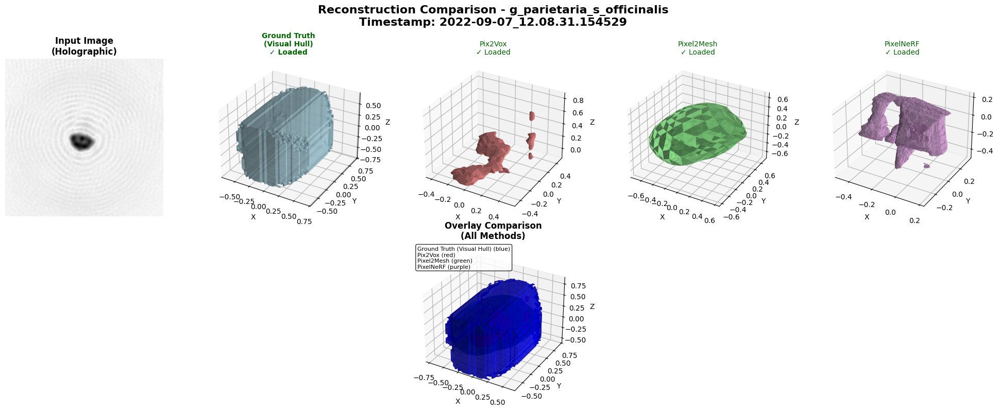

  ✓ Successfully created visualization

Processing 2/21: 2022-09-07_12.08.31.693529


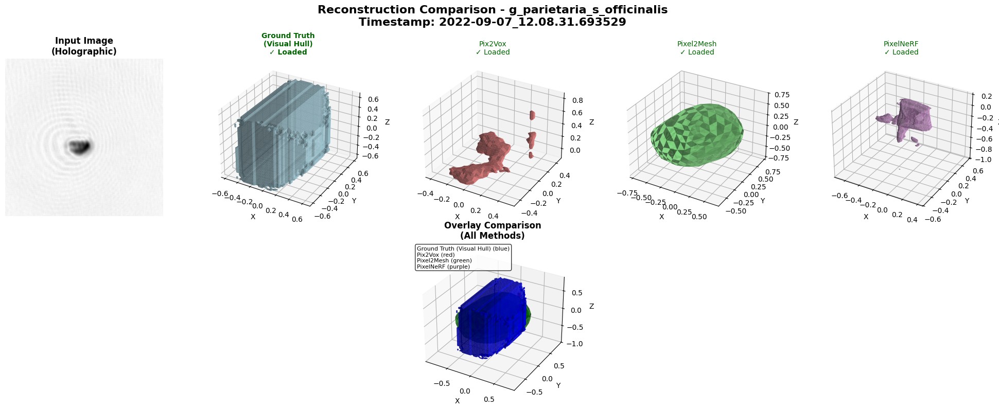

  ✓ Successfully created visualization

Processing 3/21: 2022-09-07_12.08.31.693529


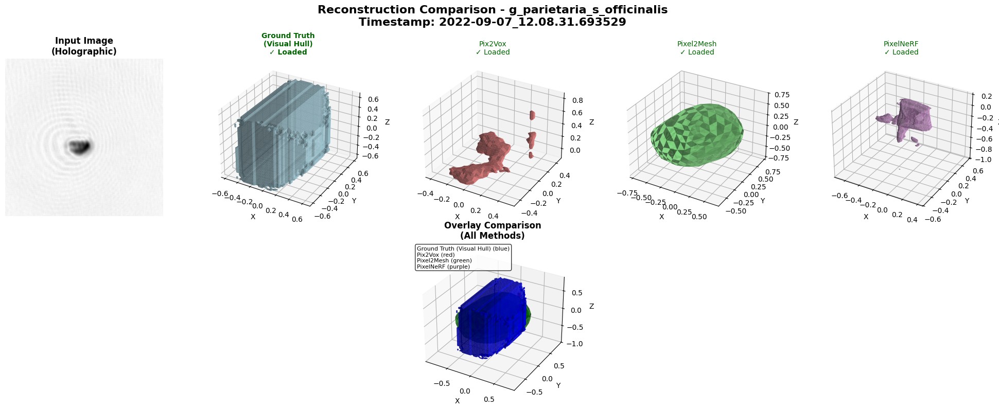

  ✓ Successfully created visualization

Processing 4/21: 2022-09-07_12.08.31.792529


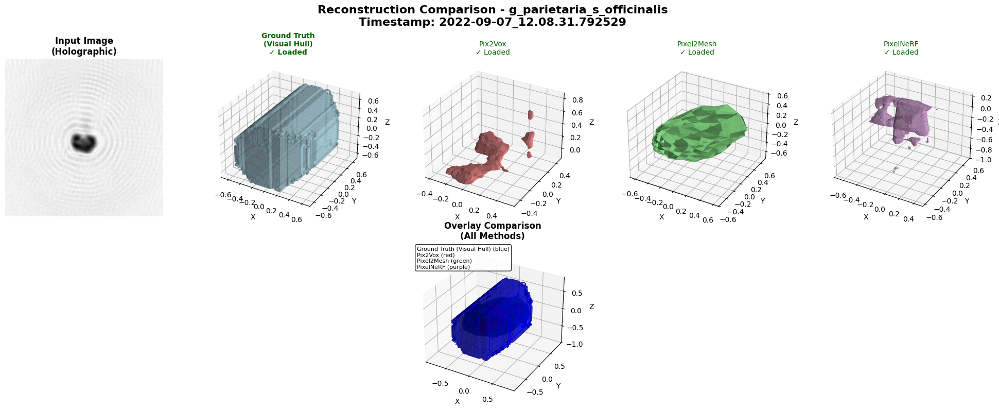

  ✓ Successfully created visualization

Processing 5/21: 2022-09-07_12.08.31.792529


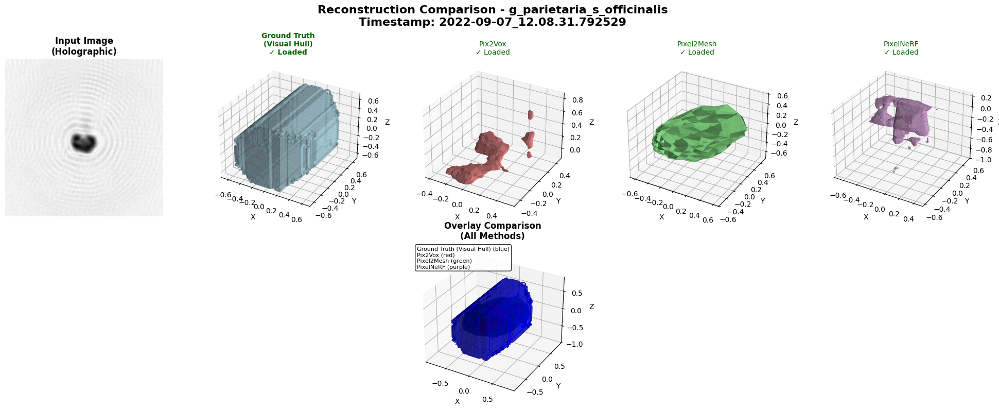

  ✓ Successfully created visualization

Processing 6/21: 2022-09-07_12.08.31.947529


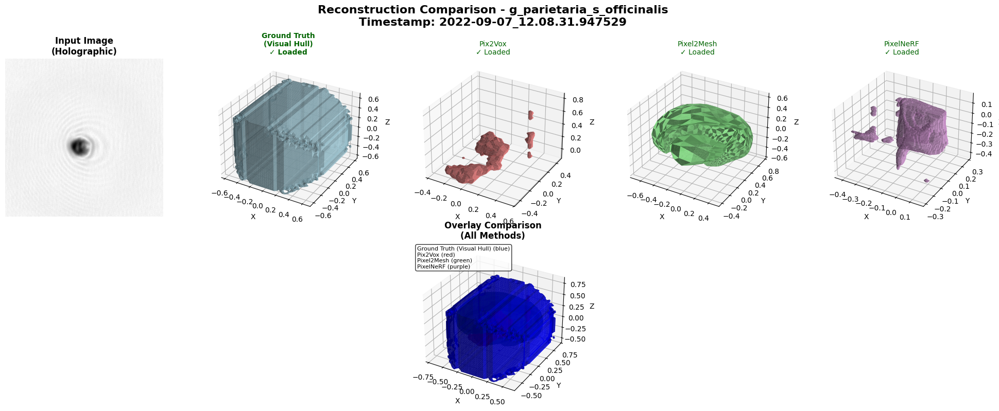

  ✓ Successfully created visualization

Processing 7/21: 2023-04-06_13.19.30.089087


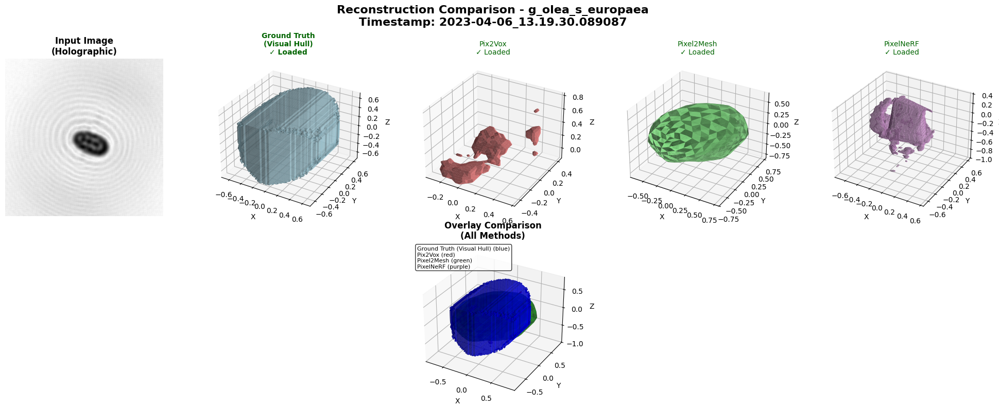

  ✓ Successfully created visualization

Processing 8/21: 2023-04-06_13.19.30.213087


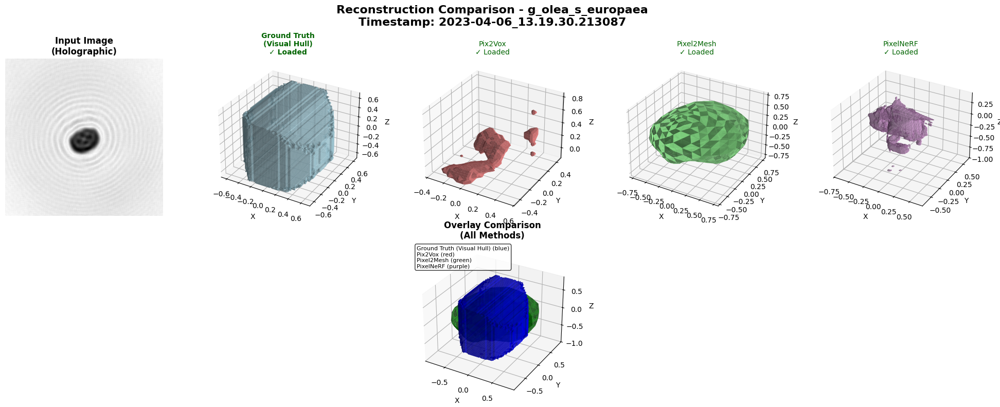

  ✓ Successfully created visualization

Processing 9/21: 2023-04-06_13.19.30.465087


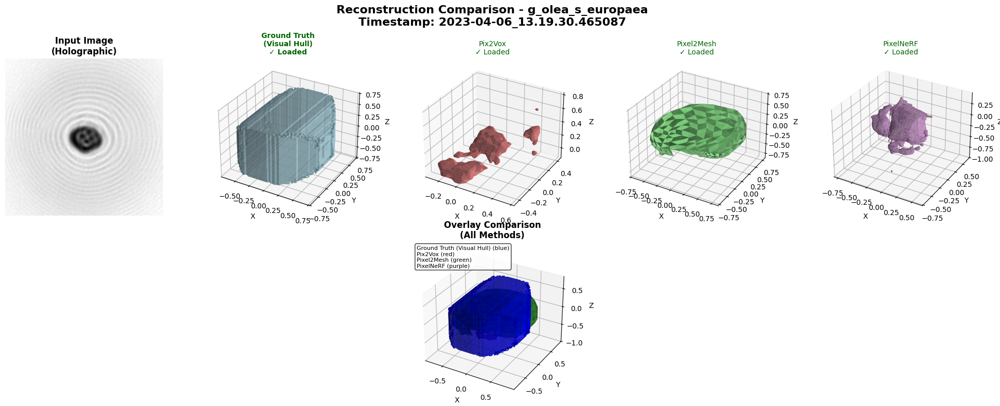

  ✓ Successfully created visualization

Processing 10/21: 2023-05-04_13.20.25.490385


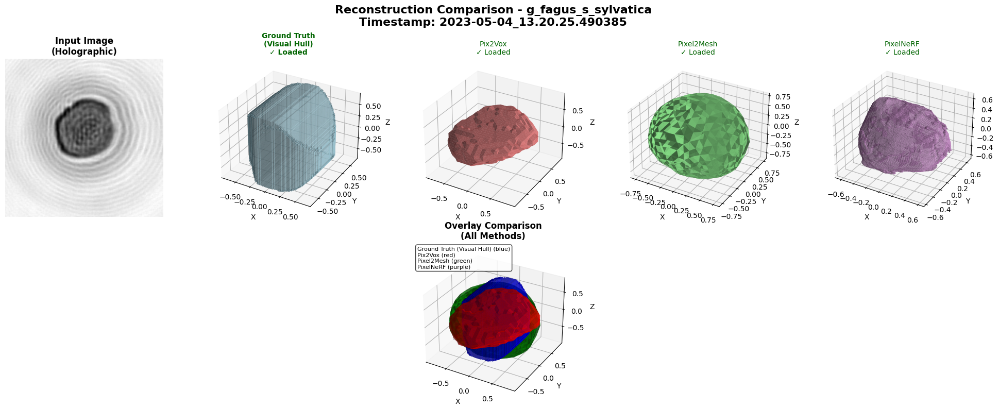

  ✓ Successfully created visualization

Processing 11/21: 2023-05-04_13.20.25.568385


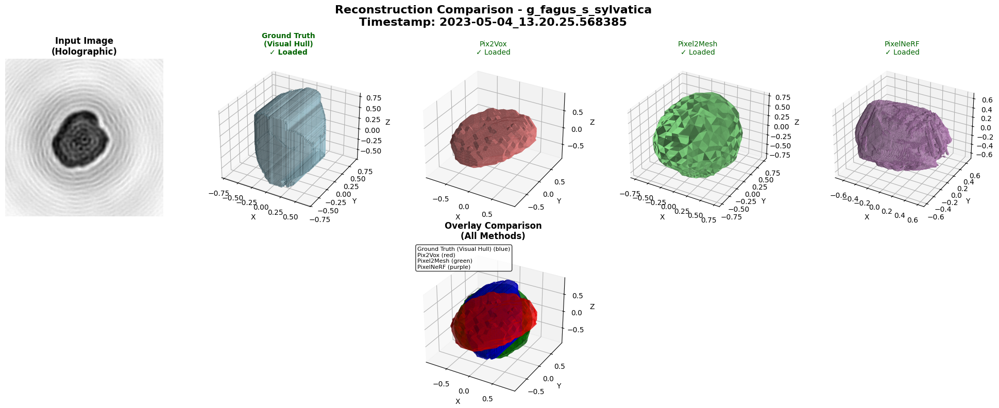

  ✓ Successfully created visualization

Processing 12/21: 2023-05-04_13.20.28.024384


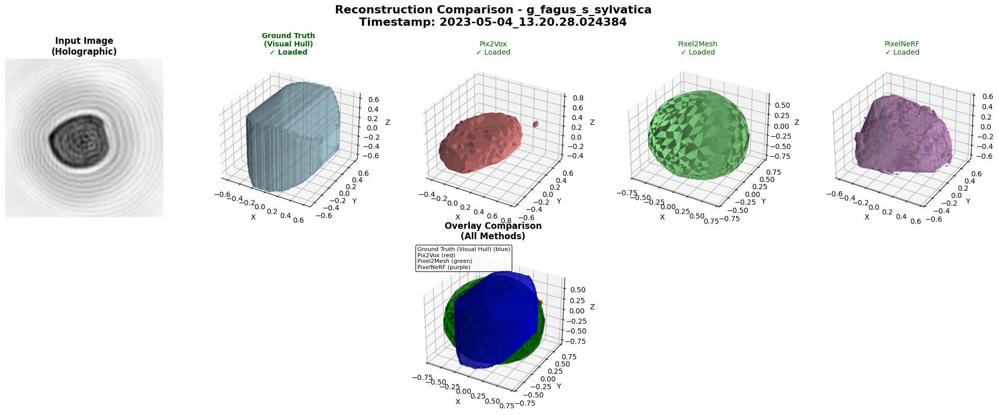

  ✓ Successfully created visualization

Processing 13/21: 2023-04-06_18.06.28.175254


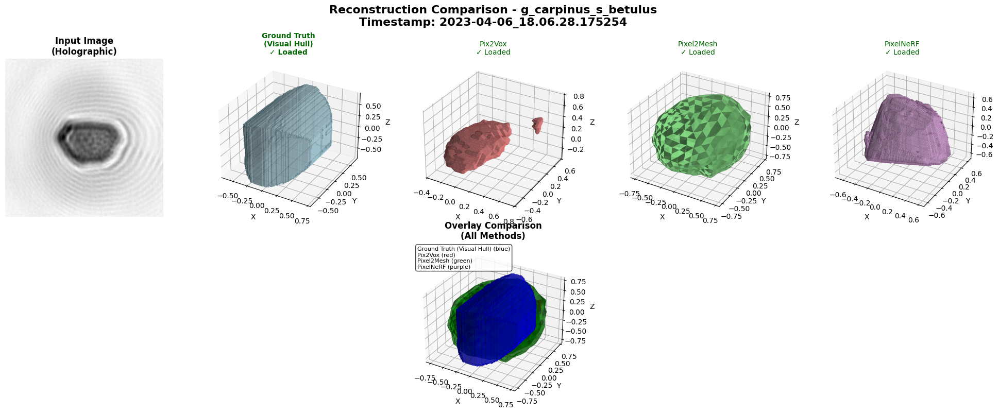

  ✓ Successfully created visualization

Processing 14/21: 2023-04-06_18.06.28.401254


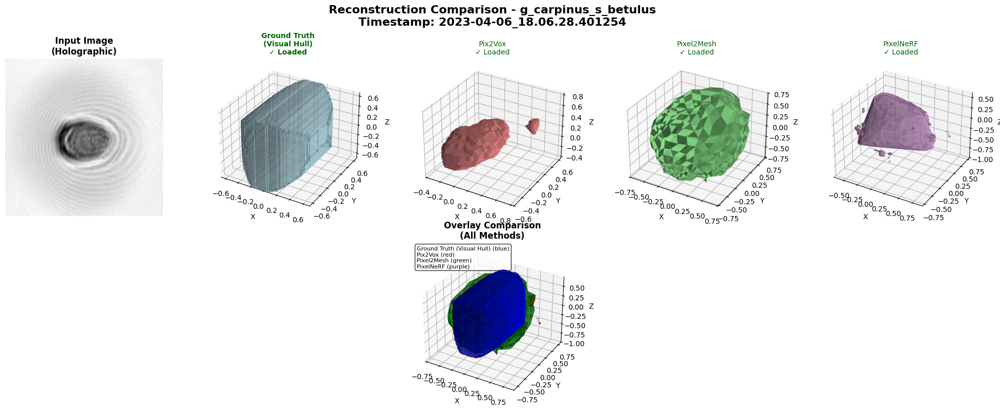

  ✓ Successfully created visualization

Processing 15/21: 2023-04-06_18.06.28.963254


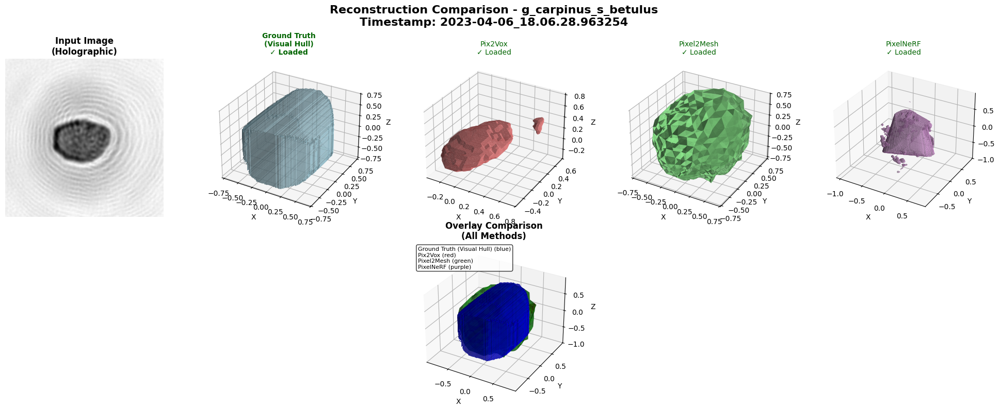

  ✓ Successfully created visualization

Processing 16/21: 2023-05-05_08.09.07.396796


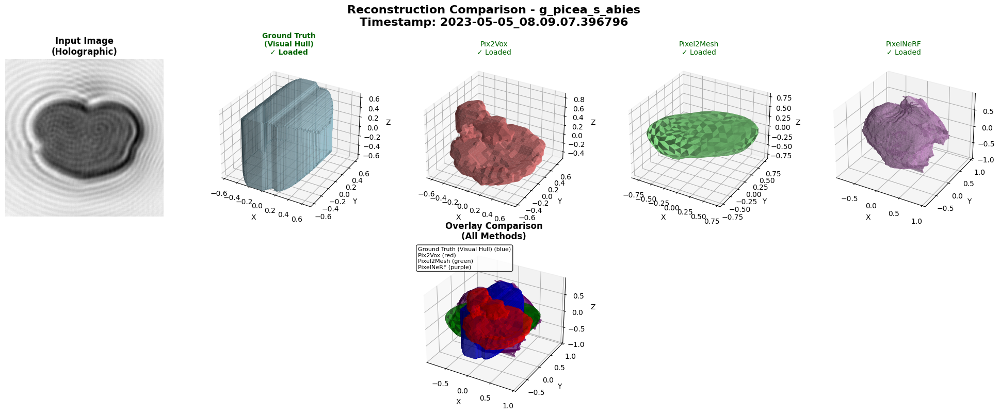

  ✓ Successfully created visualization

Processing 17/21: 2023-05-05_08.09.07.572796


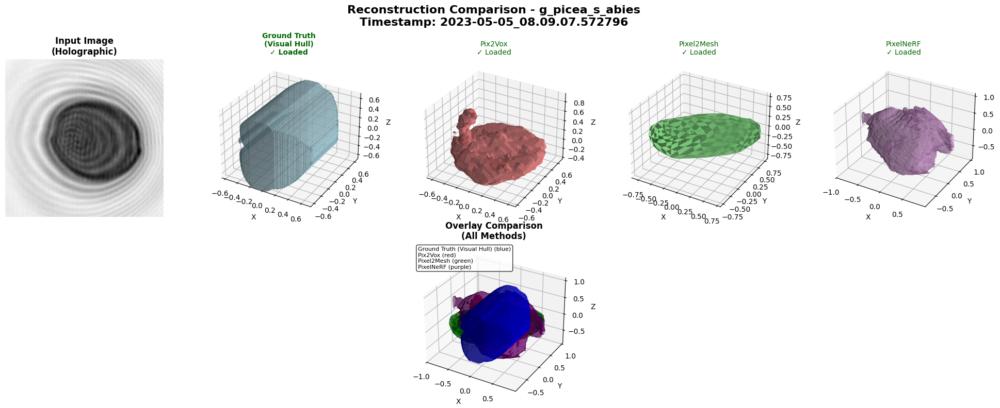

  ✓ Successfully created visualization

Processing 18/21: 2023-05-05_08.09.08.621796


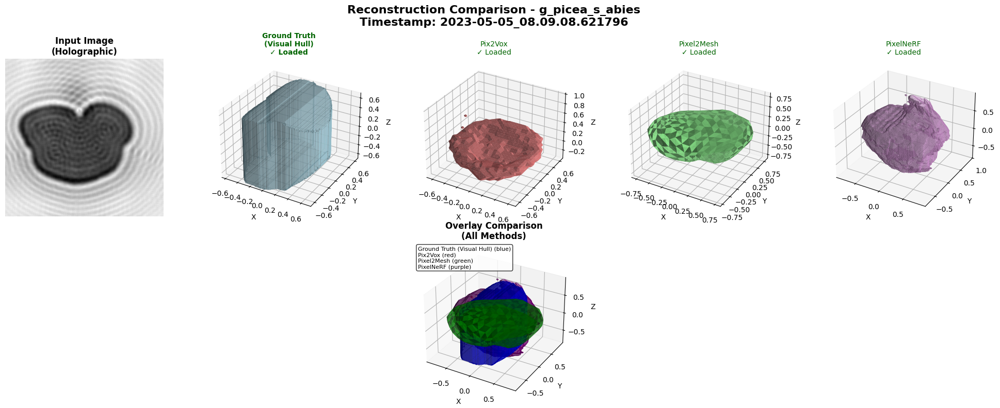

  ✓ Successfully created visualization

Processing 19/21: 2023-05-05_10.14.49.092481


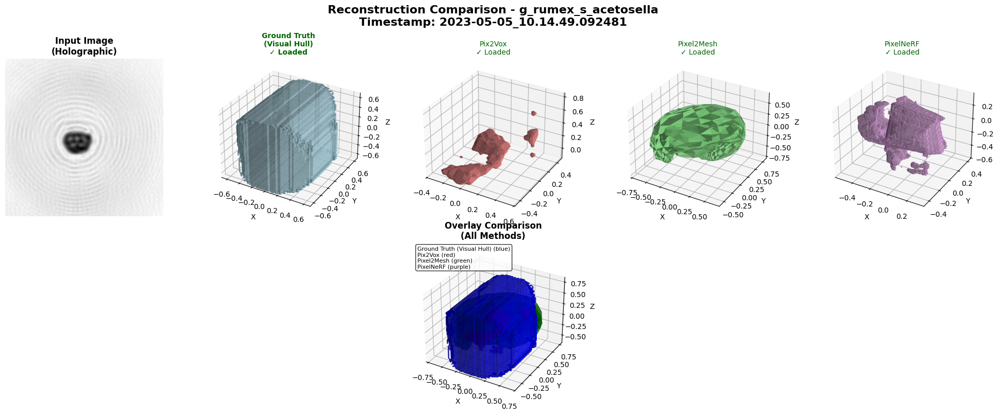

  ✓ Successfully created visualization

Processing 20/21: 2023-05-05_10.14.49.372481


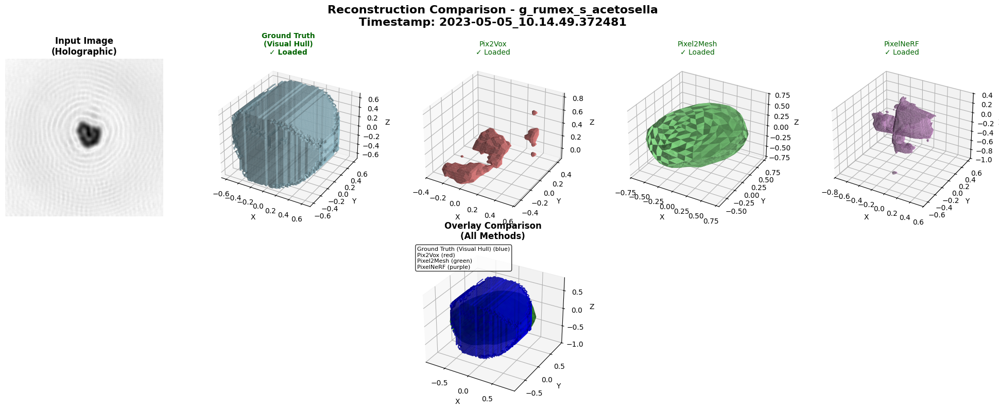

  ✓ Successfully created visualization

Processing 21/21: 2023-05-05_10.14.49.480481


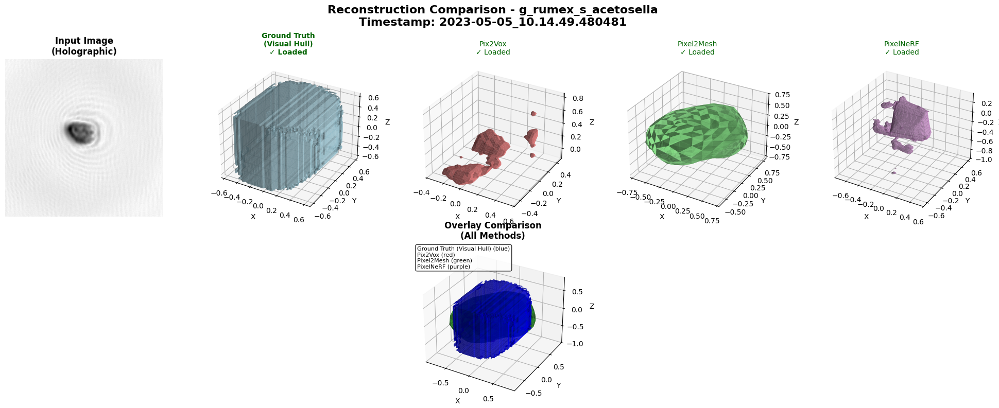

  ✓ Successfully created visualization

SUMMARY:
Successful visualizations: 21
Failed visualizations: 0
Success rate: 100.0%


In [20]:
# Use already initialized visualizer to process ALL 21 reconstructions
print(
    "Starting comprehensive processing of all 21 holographic pollen reconstructions..."
)
print(f"Found {len(mapping_df)} reconstructions to process")

process_all()